In [1]:
import numpyro
numpyro.enable_x64()
numpyro.set_platform("cpu")
numpyro.set_host_device_count(10)

import arviz as az
import numpy as np
import pandas as pd
import jax.numpy as jnp
from cycler import cycler
import matplotlib
import matplotlib.pyplot as plt
from jax import random, jit, lax, pmap, vmap
from corner import corner, overplot_points, overplot_lines
from numpyro import handlers
from numpyro.infer import MCMC, NUTS, init_to_uniform, init_to_feasible, Predictive, SVI, Trace_ELBO
from numpyro.infer.autoguide import AutoDelta
from numpyro.optim import Adam
from eggman.infer import Star
from functools import partial

rng = random.PRNGKey(42)

Holoviews not imported. Some visualizations will not be available.
PyMultiNest not imported.  MultiNest fits will not work.
I0000 00:00:1697116507.376637  114565 tfrt_cpu_pjrt_client.cc:349] TfrtCpuClient created.


In [2]:
dist = numpyro.distributions

In [45]:
interval = dist.constraints.interval

In [93]:
from eggman.infer.models import lognorm_from_norm
from eggman.distributions import LogSalpeter

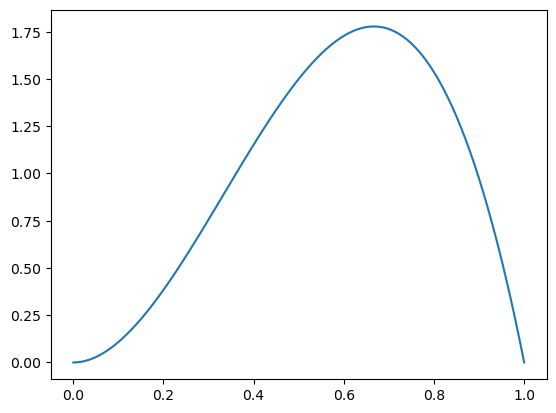

In [120]:
x = np.linspace(0, 1, 101)
p = np.exp(dist.Beta(3, 2).log_prob(x))
plt.plot(x, p)

In [129]:
ln10 = jnp.log(10)

class EEPStar(Star):
    
    def prior(self, const):
        x = numpyro.sample("x", dist.Uniform(0.0, 0.999))
#         x = numpyro.sample("x", dist.Beta(1.4, 1.2))
#         ln_mass = numpyro.sample("ln_mass", LogSalpeter(jnp.log(0.7), jnp.log(2.3), rate=2.35))
        # Good approximation of Chabrier IMF
        ln_mass = numpyro.sample("ln_mass", dist.TruncatedNormal(-0.2, 0.7, low=jnp.log(0.7), high=jnp.log(2.3)))
        y = numpyro.sample("Y", dist.Uniform(0.22, 0.32))
        mh = numpyro.sample("M_H", dist.TruncatedNormal(const["M_H"]["mu"], const["M_H"]["sigma"], low=-0.9, high=0.5))
        a_mlt = numpyro.sample("a_MLT", dist.Uniform(1.3, 2.7))
        
        plx_dist = dist.LogNormal(*lognorm_from_norm(const["plx"]["mu"], const["plx"]["sigma"]))
        plx = numpyro.sample("plx", plx_dist)

        av_dist = dist.LogNormal(*lognorm_from_norm(const["Av"]["mu"], const["Av"]["sigma"]))            
        av = numpyro.sample("Av", av_dist)

        return x, ln_mass, y, mh, a_mlt, plx, av

    def emulate_star(self, x, ln_mass, y, mh, a_mlt):
        inputs = self._emulator_inputs(x, ln_mass, y, mh, a_mlt)
        yy = self.emulator(inputs)

        log_lum = numpyro.deterministic("log_lum", self.log_luminosity(yy[1], yy[2]))
        log_rad = numpyro.deterministic("log_rad", yy[2])
        numpyro.deterministic("rad", 10**log_rad)

        logg = numpyro.deterministic("logg", self.log_gravity(ln_mass/ln10, log_rad))
        lum = numpyro.deterministic("lum", 10**log_lum)
        teff = numpyro.deterministic("Teff", 10**yy[1])
        dnu = numpyro.deterministic("Dnu", 10**yy[3])
        
        log_age = numpyro.deterministic("log_age", yy[0])
        age = numpyro.deterministic("age", 10**(log_age - 9))
        
        age_dist = dist.Beta(3., 2.)
        numpyro.factor("age_prob", age_dist.log_prob(age/14.))
        return teff, logg, log_lum

In [130]:
model = EEPStar()

In [131]:
const = {}
const["M_H"] = dict(mu=0.0, sigma=2.0)
const["plx"] = dict(mu=0.1, sigma=1e-3)
const["Av"] = dict(mu=0.01, sigma=0.001)

In [132]:
sampler = NUTS(model)
mcmc = MCMC(sampler, num_warmup=1000, num_samples=1000, num_chains=10)

In [133]:
rng, key = random.split(rng)

mcmc.run(key, const)

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

In [134]:
mcmc.print_summary()


                mean       std    median      5.0%     95.0%     n_eff     r_hat
        Av      0.01      0.00      0.01      0.01      0.01   5368.71      1.00
       M_H     -0.19      0.40     -0.20     -0.75      0.50   4455.24      1.00
         Y      0.27      0.03      0.27      0.22      0.31   5423.38      1.00
     a_MLT      2.00      0.40      1.99      1.39      2.63   5243.22      1.00
   ln_mass      0.03      0.20      0.01     -0.32      0.33   2771.01      1.00
       plx      0.10      0.00      0.10      0.10      0.10   5555.43      1.00
         x      0.58      0.24      0.58      0.25      1.00   3742.26      1.00

Number of divergences: 2573


In [135]:
data = az.from_numpyro(mcmc)
data

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats
	> observed_data

array([[<Axes: title={'center': 'x'}>, <Axes: title={'center': 'x'}>],
       [<Axes: title={'center': 'EEP'}>, <Axes: title={'center': 'EEP'}>],
       [<Axes: title={'center': 'mass'}>,
        <Axes: title={'center': 'mass'}>],
       [<Axes: title={'center': 'M_H'}>, <Axes: title={'center': 'M_H'}>],
       [<Axes: title={'center': 'Y'}>, <Axes: title={'center': 'Y'}>],
       [<Axes: title={'center': 'a_MLT'}>,
        <Axes: title={'center': 'a_MLT'}>],
       [<Axes: title={'center': 'age'}>, <Axes: title={'center': 'age'}>]],
      dtype=object)

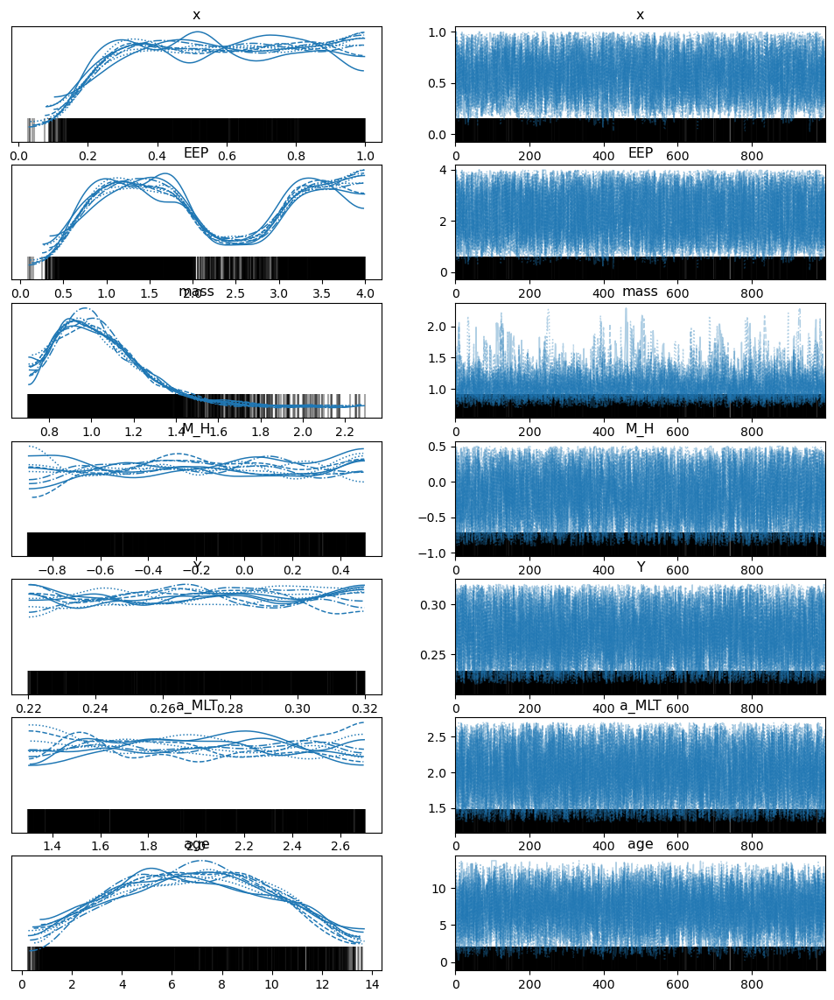

In [136]:
az.plot_trace(data, var_names=["x", "EEP", "mass", "M_H", "Y", "a_MLT", "age"])

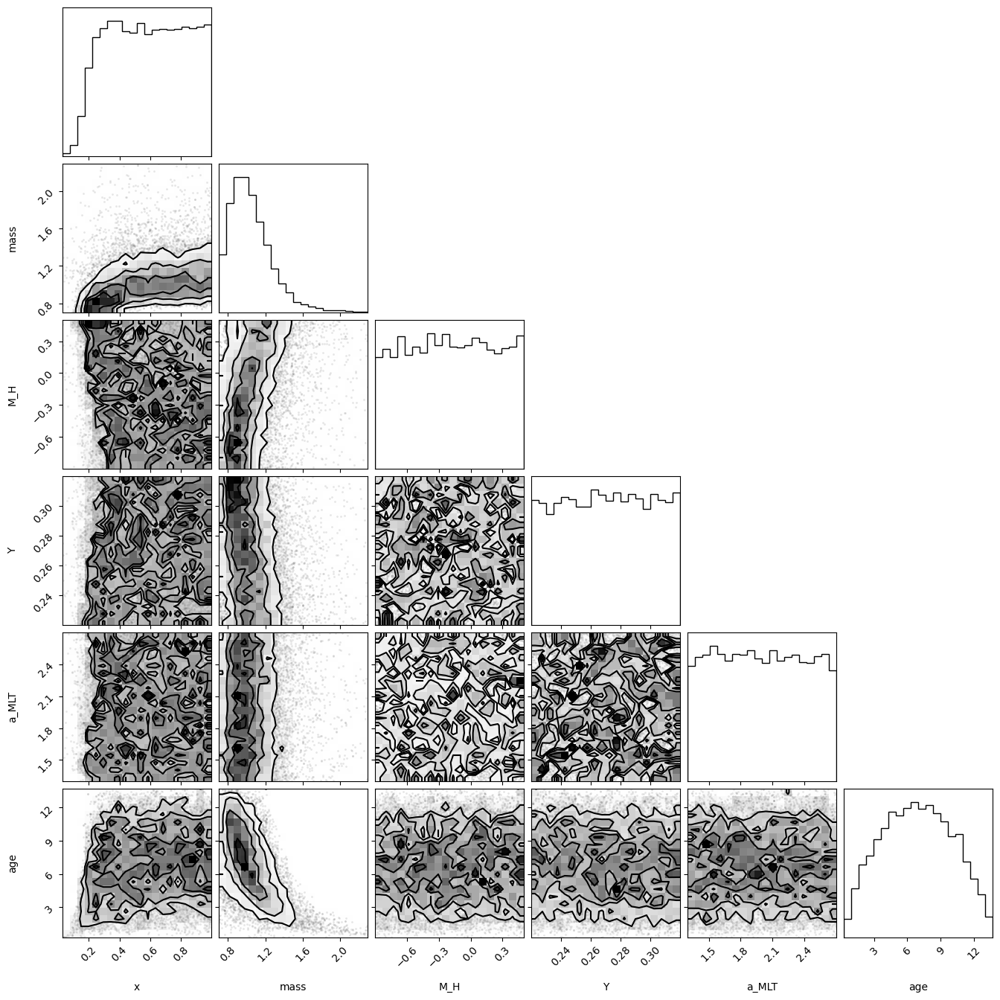

In [140]:
fig = corner(data, var_names=["x", "mass", "M_H", "Y", "a_MLT", "age"])

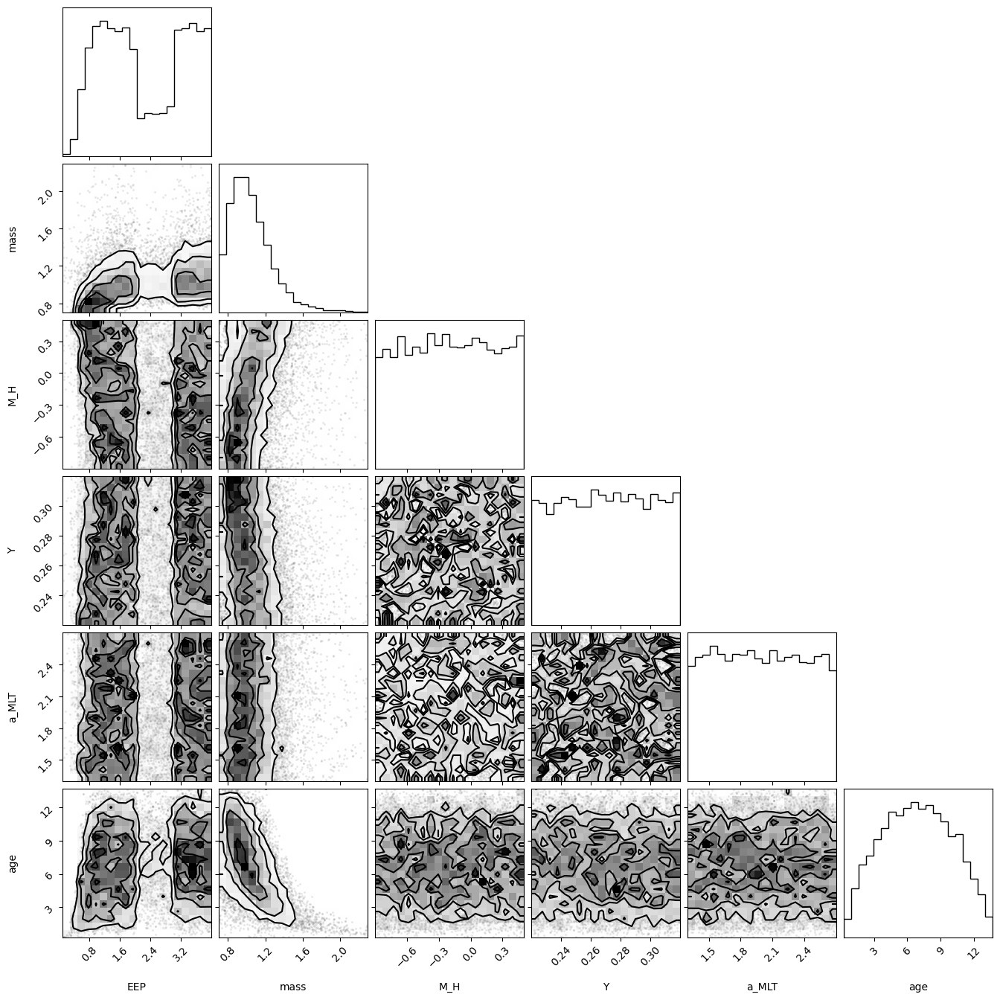

In [141]:
fig = corner(data, var_names=["EEP", "mass", "M_H", "Y", "a_MLT", "age"])

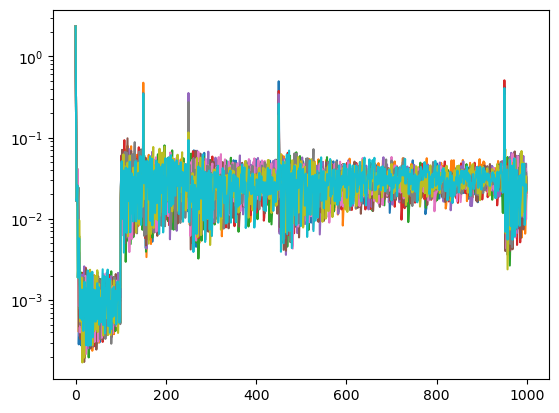

In [15]:
plt.plot(step_size.T)
plt.yscale("log");

In [16]:
def polish_traceplot(fig, axes):
    for ax in axes[:, 0]:
        title = ax.get_title()
        ax.set_xlabel(title)
        ax.set_title(None)
    for ax in axes[:, 1]:
        title = ax.get_title()
        ax.set_xlabel("step")
        ax.set_ylabel(title)
        ax.set_title(None)

    fig = plt.gcf()
    fig.align_labels()
    fig.tight_layout() 
    return fig, axes

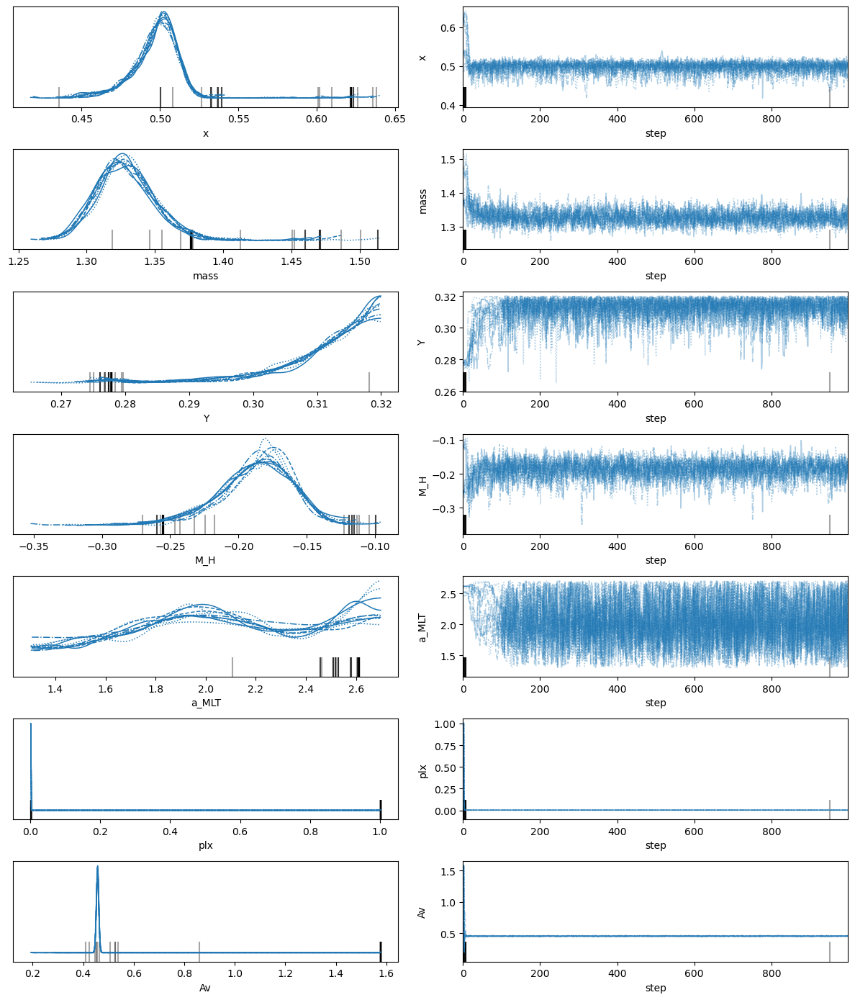

In [17]:
var_names = [
    "x", 
    "mass", 
    "Y", 
    "M_H", 
    "a_MLT", 
    "plx",
    "Av",
]
backend_kwargs = {"tight_layout": True}

axes = az.plot_trace(az.from_numpyro(mcmc), var_names=var_names, backend_kwargs=backend_kwargs)
_ = polish_traceplot(plt.gcf(), axes)

In [18]:
rng, key = random.split(rng)
mcmc.run(key, const, extra_fields=extra_fields, obs=obs)
mcmc.print_summary()

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]


                mean       std    median      5.0%     95.0%     n_eff     r_hat
        Av      0.46      0.00      0.46      0.45      0.46   7455.13      1.00
       M_H     -0.19      0.03     -0.18     -0.23     -0.15   3300.04      1.00
         Y      0.31      0.01      0.31      0.30      0.32   4268.04      1.00
     a_MLT      2.05      0.38      2.03      1.53      2.70   5165.43      1.00
   ln_mass      0.28      0.02      0.28      0.26      0.31   3379.67      1.00
       plx      0.00      0.00      0.00      0.00      0.00   3621.17      1.00
         x      0.50      0.01      0.50      0.47      0.52   3478.83      1.00

Number of divergences: 0


In [19]:
data = az.from_numpyro(mcmc)
data

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats
	> observed_data

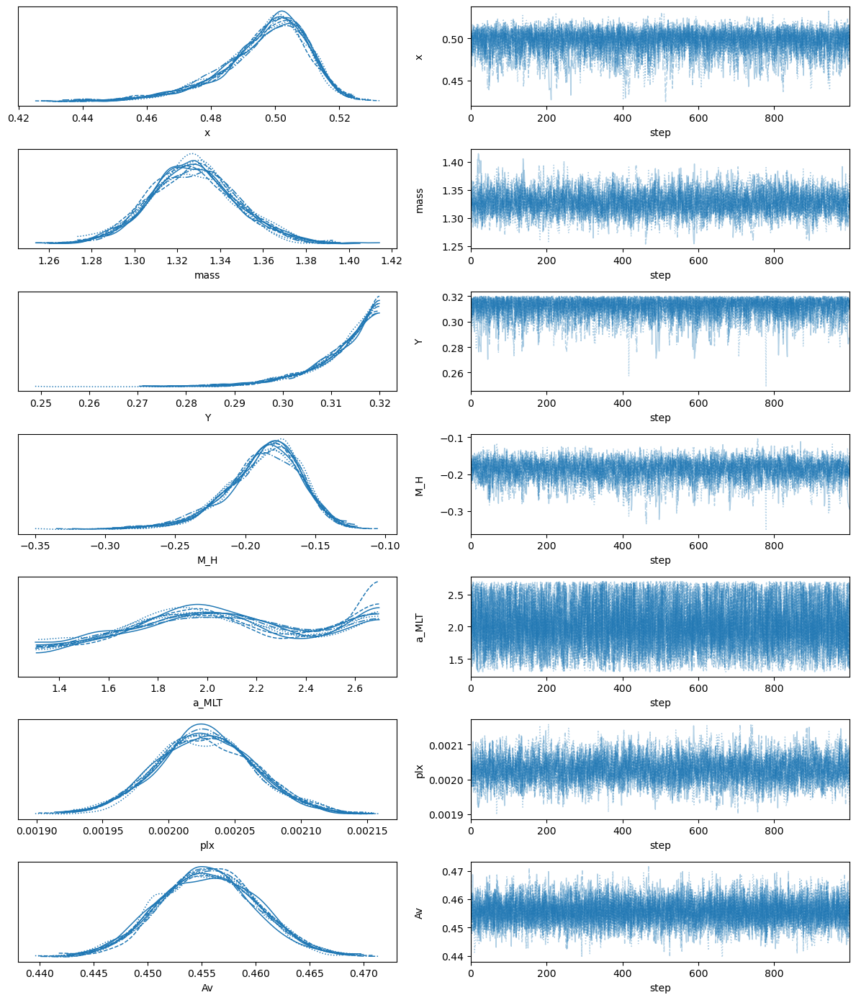

In [20]:
backend_kwargs = {"tight_layout": True}
axes = az.plot_trace(data, var_names=var_names, backend_kwargs=backend_kwargs)

_ = polish_traceplot(plt.gcf(), axes)

In [21]:
rng, key = random.split(rng)

predict = Predictive(model, posterior_samples=init_params)
init_params.update(predict(key, const, obs))

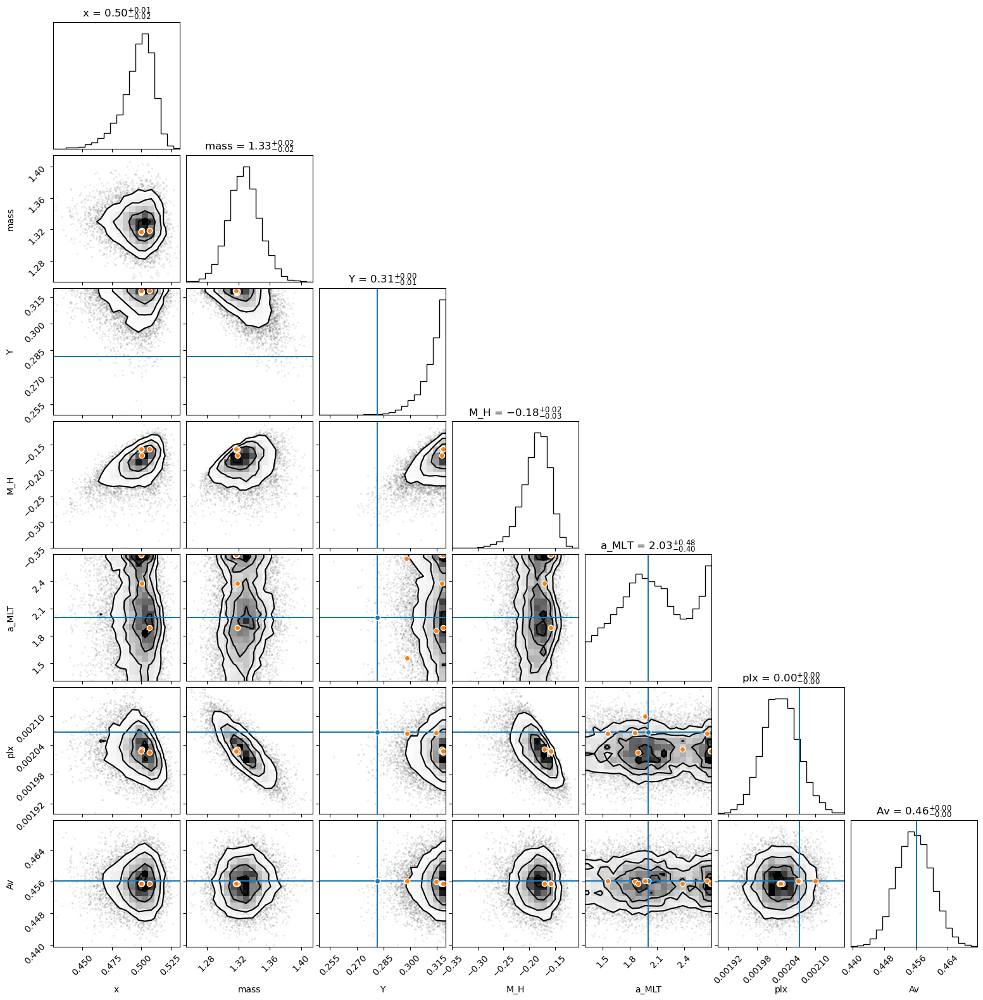

In [22]:
var_names = [
    "x", 
    "mass", 
    "Y", 
    "M_H", 
    "a_MLT", 
    "plx",
    "Av",
]
divergences_kwargs = dict(c="C2", marker="o", markeredgecolor="white")

fig = corner(
    data, 
    var_names=var_names, 
    divergences=True,
    divergences_kwargs=divergences_kwargs,
    show_titles=True,
)

xs = np.array([truths[k][i] for k in var_names])
overplot_lines(fig, xs, c="C0")
overplot_points(fig, xs.reshape((1, -1)), c="C0", marker="o", markeredgecolor="white")

xs = np.stack([init_params[k] for k in var_names], 1)
overplot_points(fig, xs, c="C1", marker="o", markeredgecolor="white")

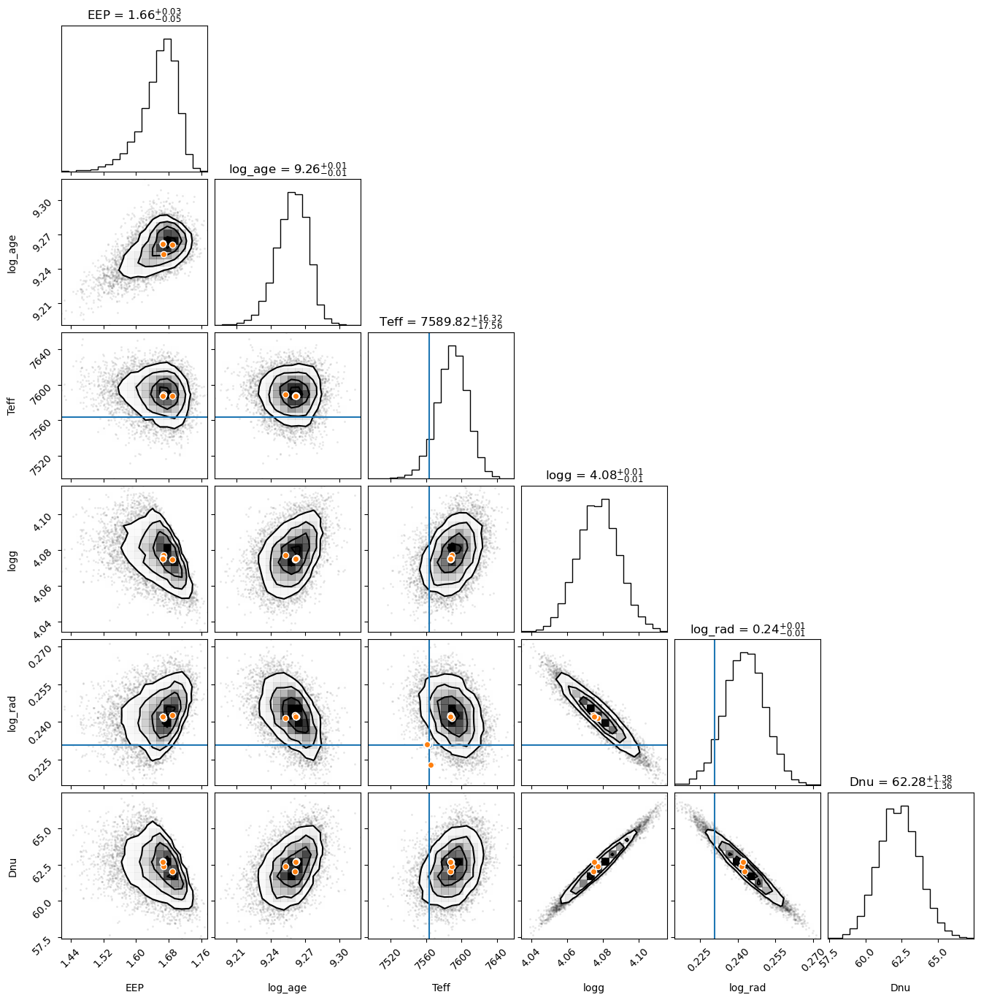

In [23]:
var_names = [
    "EEP", "log_age", "Teff", "logg", "log_rad", "Dnu"
]

fig = corner(
    data, 
    var_names=var_names, 
    divergences=True,
    divergences_kwargs=divergences_kwargs,
    show_titles=True,
)

xs = np.array([truths[k][i] for k in var_names])
overplot_lines(fig, xs, c="C0")
overplot_points(fig, xs.reshape((1, -1)), c="C0", marker="o", markeredgecolor="white")

xs = np.stack([init_params[k] for k in var_names], 1)
overplot_points(fig, xs, c="C1", marker="o", markeredgecolor="white")

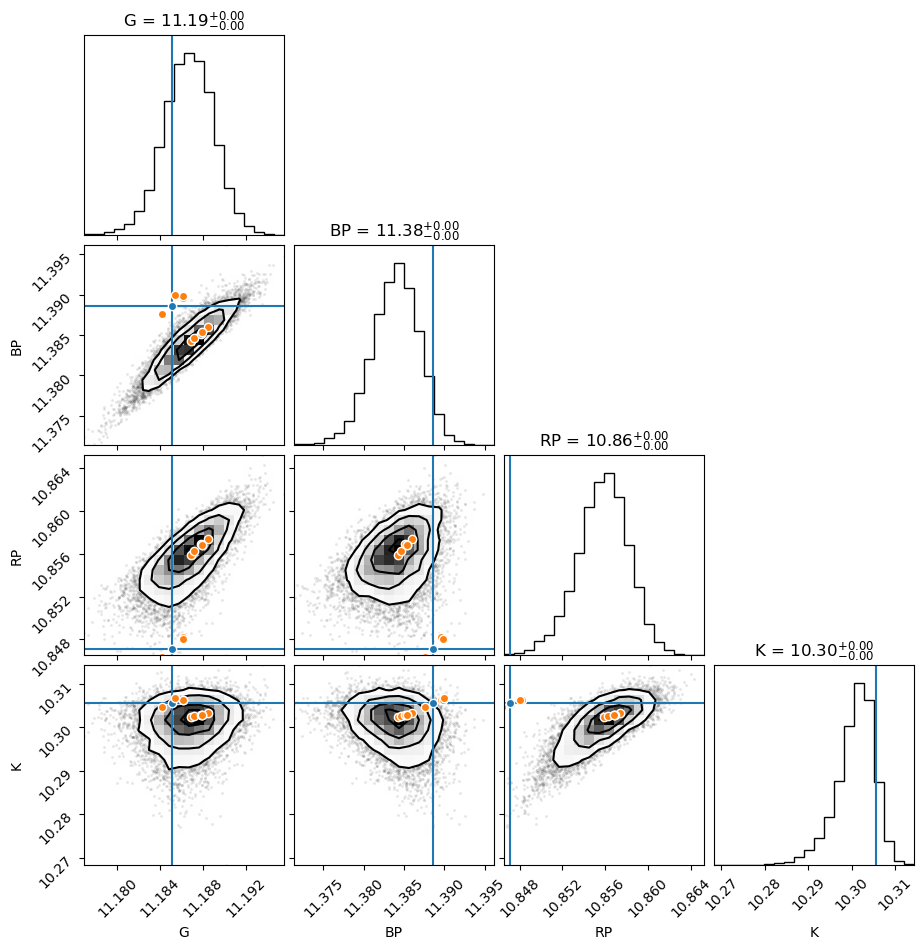

In [24]:
var_names = model.bands

fig = corner(
    data, 
    var_names=var_names, 
    divergences=True,
    divergences_kwargs=divergences_kwargs,
    show_titles=True,
)

xs = np.array([truths[k][i] for k in var_names])
overplot_lines(fig, xs, c="C0")
overplot_points(fig, xs.reshape((1, -1)), c="C0", marker="o", markeredgecolor="white")

xs = np.stack([init_params[k] for k in var_names], 1)
overplot_points(fig, xs, c="C1", marker="o", markeredgecolor="white")

In [25]:
from numpyro.contrib.nested_sampling import UniformReparam
from numpyro.infer.util import log_density

In [26]:
rng, key = random.split(rng)
# reparam the model so that latent sites have Uniform(0, 1) priors
trace = handlers.trace(handlers.seed(model, key)).get_trace(const, obs=obs)
param_names = [
    site["name"]
    for site in trace.values()
    if site["type"] == "sample"
    and not site["is_observed"]
    and site["infer"].get("enumerate", "") != "parallel"
]
deterministics = [
    site["name"]
    for site in trace.values()
    if site["type"] == "deterministic"
]
reparam_model = handlers.reparam(
    model, config={k: UniformReparam() for k in param_names}
)

In [27]:
import dynesty
import jax
import dynesty.plotting as dyplot
from dynesty import NestedSampler, DynamicNestedSampler
from dynesty.utils import resample_equal

In [28]:
base_names = [f"{name}_base" for name in param_names]

@jax.jit
def prior_transform(u):
    return u

@jax.jit
def log_likelihood(x):
    params = dict(zip(base_names, x))
    return log_density(reparam_model, (const, obs), {}, params)[0]

In [29]:
ndim = len(param_names)
# ns = NestedSampler(log_likelihood, prior_transform, ndim, nlive=1000, sample="rwalk")
ns = DynamicNestedSampler(log_likelihood, prior_transform, ndim, nlive=1000, sample="rwalk")

In [30]:
ns.run_nested()

23366it [00:47, 493.67it/s, batch: 3 | bound: 2 | nc: 1 | ncall: 518968 | eff(%):  4.288 | loglstar: 16.131 < 19.426 < 16.568 | logz:  6.740 +/-  0.085 | stop:  0.957]              


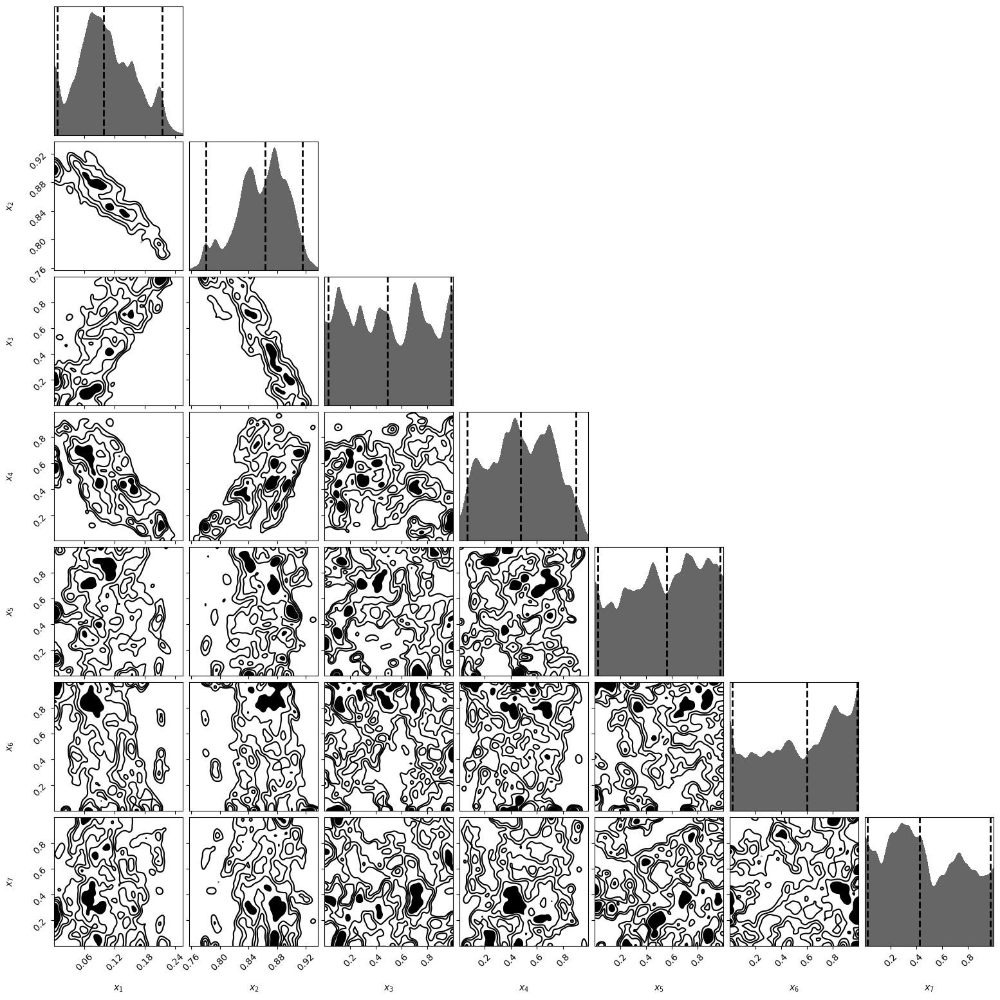

In [31]:
dyplot.cornerplot(ns.results);

In [32]:
samples = ns.results.samples_equal()
samples = dict(zip(base_names, samples.T))

In [33]:
rng, key = random.split(rng)
predict = Predictive(reparam_model, samples)
posterior = predict(key, const)
mask = posterior["age"] < 14e9
posterior = {key: value[mask] for key, value in posterior.items()}

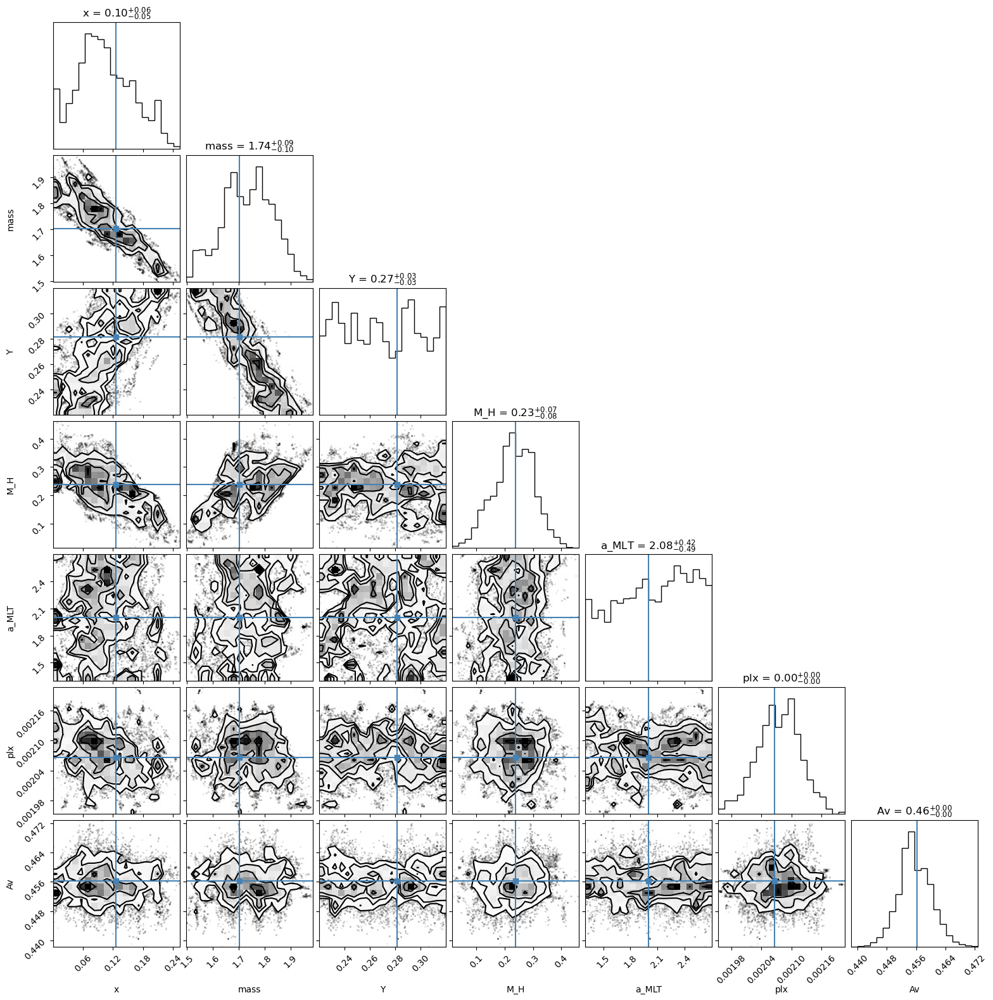

In [34]:
var_names=["x", "mass", "Y", "M_H", "a_MLT", "plx", "Av"]

fig = corner(
    posterior, 
    var_names=var_names, 
    truths={k: truths[k][i] for k in var_names},
    show_titles=True,
)

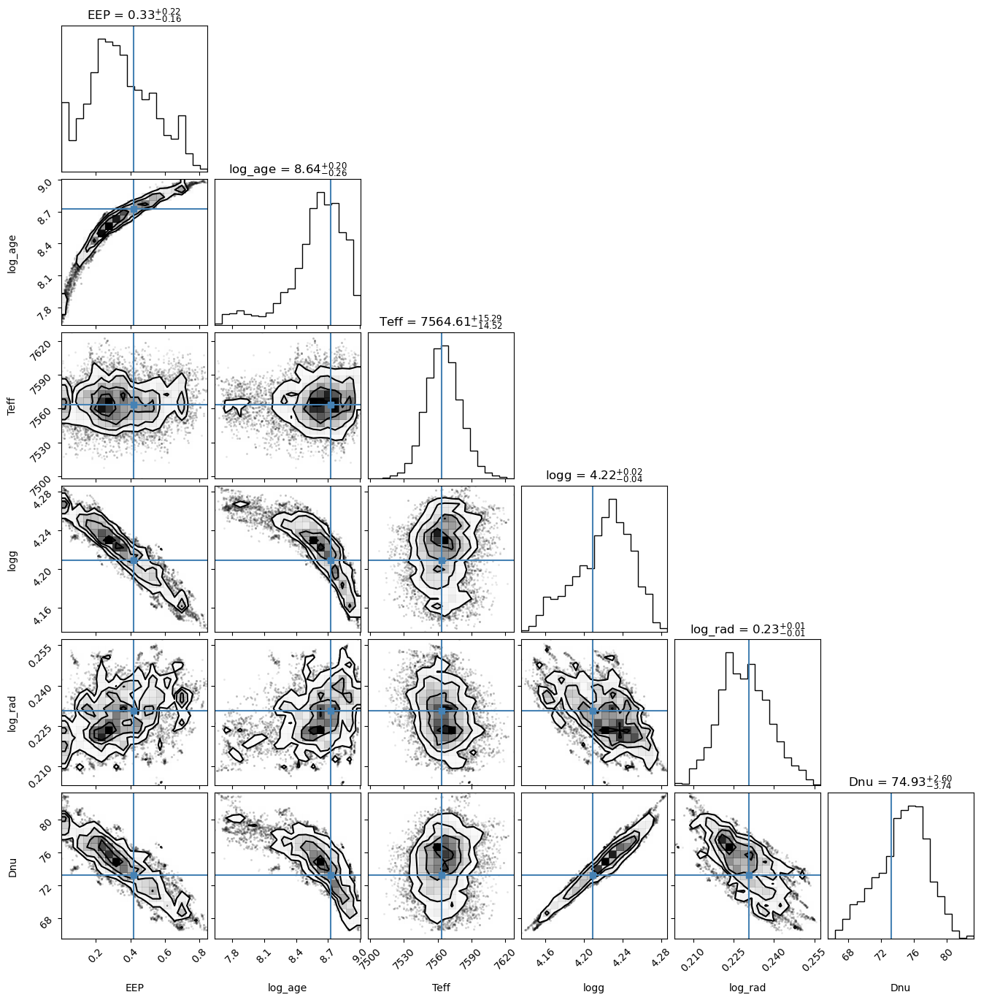

In [35]:
var_names = [
    "EEP", "log_age", "Teff", "logg", "log_rad", "Dnu"
]

fig = corner(
    posterior, 
    var_names=var_names, 
    truths={k: truths[k][i] for k in var_names},
    show_titles=True,
)

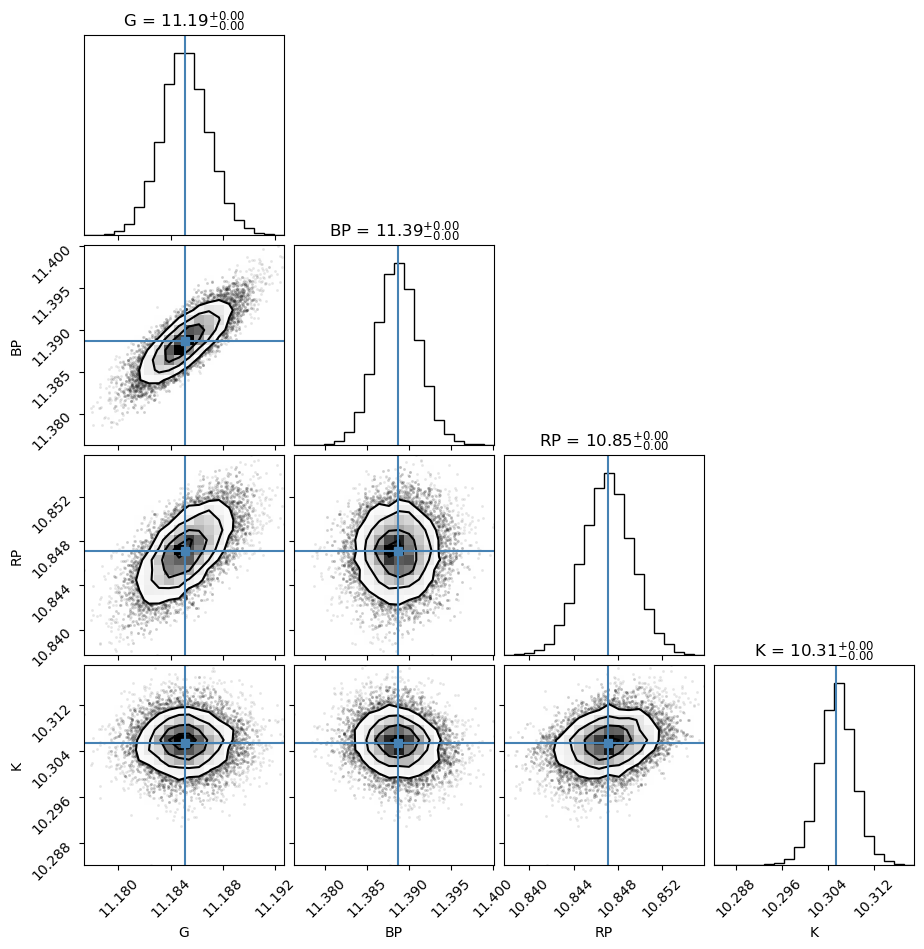

In [36]:
var_names = model.bands

fig = corner(
    posterior, 
    var_names=var_names, 
    truths={k: truths[k][i] for k in var_names},
    show_titles=True,
)